In [1]:
run '../__init__.py'

In [2]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima

# Forecast of Richards Ave Station Arrivals

https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8888199

the number of vehicle
arrivals for Richards Ave station near downtown Davis [see
Fig. 3(b)] [24]. The data of arrivals are the total number of the
passing-by vehicles. We use the scaled number of arrivals to
model the number of EVs that enter the charging station

**Goals:**
1. Fit a model to conduct short-term (day-ahead) forecasts at hourly granularity:
2. Use forecasted arrival times and an assumed parking duration to forecast demand

*Why hourly?*

Generally, participants in RTP programs pay for energy at a rate that is linked to the hourly market price for electricity. Participants are made aware of the hourly prices on either a day-ahead or hour-ahead basis. Typically, only the largest customers (generally above one megawatt of load) face hour ahead prices.

In [3]:
arrivals = pd.read_parquet("data_transformed/arrivals.parquet")

In [4]:
arrivals['timestamp'] = arrivals[['timestamp', 'hour', 'minute', 'second']].progress_apply(
    lambda row: pd.Timestamp.combine(row[0].date(), datetime.time(*row[1:])), axis=1
)

  0%|          | 0/2437851 [00:00<?, ?it/s]

In [5]:
arrivals = arrivals.sort_values(by=['timestamp', 'flow_type']).reset_index(drop=True)

In [6]:
flow2 = arrivals[arrivals.flow_type=="flow2"]\
                .groupby(pd.Grouper(key='timestamp', freq='H')).adjusted_flow.sum()

<AxesSubplot:>

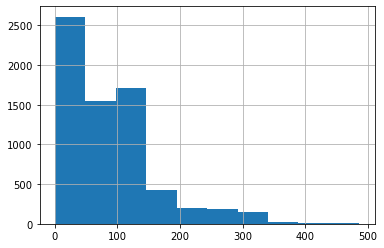

In [7]:
flow2.hist()

## EDA

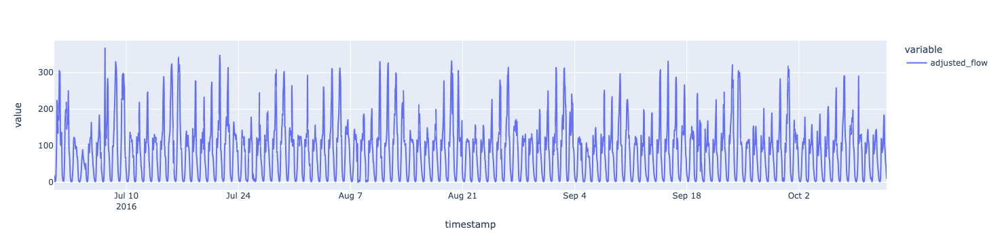

In [8]:
flow2 = flow2[flow2.index >= '2016-07-01']
px.line(flow2)

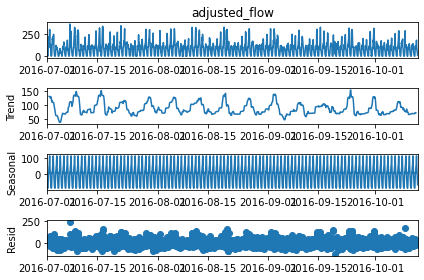

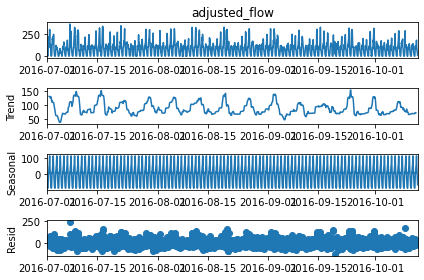

In [9]:
seasonal_decompose(flow2).plot()

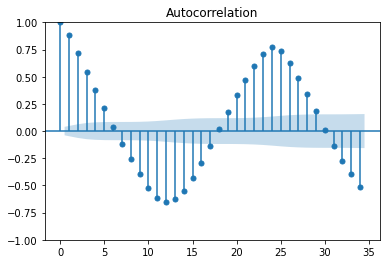

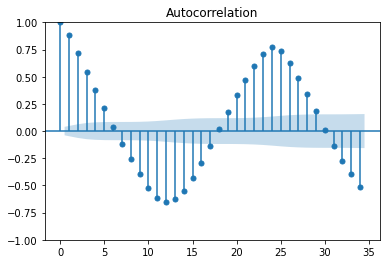

In [10]:
plot_acf(flow2)

/Users/kimsha/opt/anaconda3/envs/urbantech/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



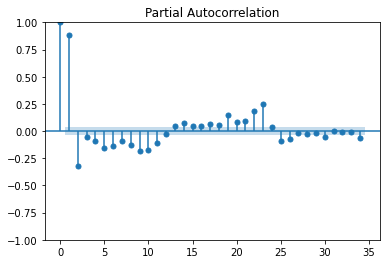

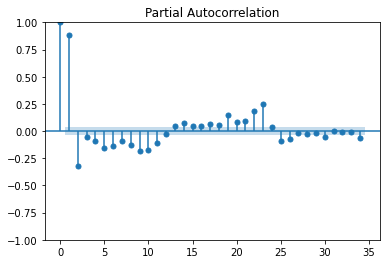

In [11]:
plot_pacf(flow2)

In [12]:
# result = adfuller(flow2)
# print('ADF Statistic: %f' % result[0])
# print('p-value: %f' % result[1])
# print('Critical Values:')
# for key, value in result[4].items():
# 	print('\t%s: %.3f' % (key, value))

## ARIMAX

X => exogenous variables

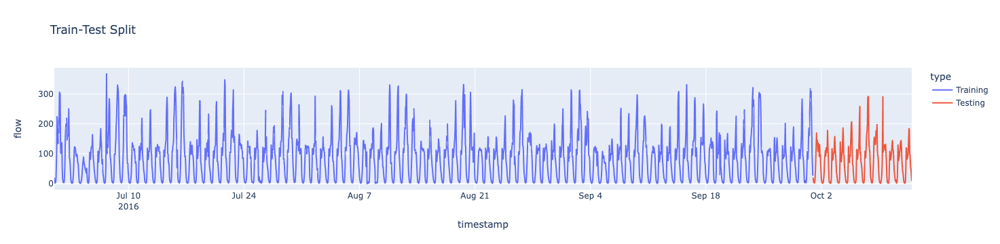

In [13]:
cutoff_date = pd.Timestamp('2016-10-01')

df = flow2.to_frame('flow')
df['type'] = 'Training'
df.loc[df.index >= cutoff_date, 'type'] = 'Testing'
px.line(df, color='type', y='flow',
        title='Train-Test Split')

In [14]:
add_feats = ['mean', 'std']
df = pd.concat([df, df.flow.rolling(6).agg(add_feats)], axis=1).dropna()

In [15]:
train = df[df.type=="Training"]
test = df[df.type=="Testing"]

In [16]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   # start_p=1, start_q=1,
                   # m=24,
                   # start_P=0, start_Q=0,
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=23639.483, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=21350.179, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=22045.652, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=23685.571, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=21096.617, Time=0.77 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=21081.111, Time=1.11 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=21070.488, Time=1.61 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=21065.266, Time=1.78 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=21054.251, Time=2.92 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=20773.965, Time=3.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=20789.897, Time=2.73 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=20799.190, Time=3.09 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.70 sec
 ARIMA(5,0,2)(0,0,0)[0] interce

In [17]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2203
Model:               SARIMAX(5, 0, 2)   Log Likelihood              -10373.995
Date:                Wed, 08 Feb 2023   AIC                          20767.990
Time:                        02:28:02   BIC                          20824.966
Sample:                    07-01-2016   HQIC                         20788.808
                         - 09-30-2016                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mean           0.8665      0.017     49.964      0.000       0.833       0.901
std            0.3184      0.039      8.192      0.000       0.242       0.395
ar.L1          1.0175      0.090     11.290      0.000       0.841       1.194
ar.L2          0.4823      0.171      2.825      0.005       0.148       0.817
ar.L3         -0.7792      0.103     -7.571      0.000      -0.981      -0.578
ar.L4          0.2271      0.030      7.541      0.000       0.168       0.286
ar.L5         -0.1039      0.023     -4.552      0.000      -0.149      -0.059
ma.L1         -0.1026      0.089     -1.147      0.251      -0.278       0.073
ma.L2         -0.8632      0.088     -9.813      0.000      -1.036      -0.691
sigma2       717.1743     12.818     55.949      0.000     692.051     742.298
===================================================================================
Ljung-Box (L1) (Q):                   0.21   Jarque-Bera (JB):              5112.92
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                            -0.48
Prob(H) (two-sided):                  0.65   Kurtosis:                        10.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Validation

In [18]:
training_fit = pd.DataFrame(model.predict_in_sample(train[add_feats]),
                            index=train.index, columns=['flow'])
training_fit['type'] = "Fit"

In [19]:
predict = pd.DataFrame(model.predict(n_periods=len(test),
                                     X=test[add_feats]),
                       index=test.index, columns=['flow'])
predict['type'] = "Predicted"

In [20]:
validate = pd.concat([df, training_fit, predict])

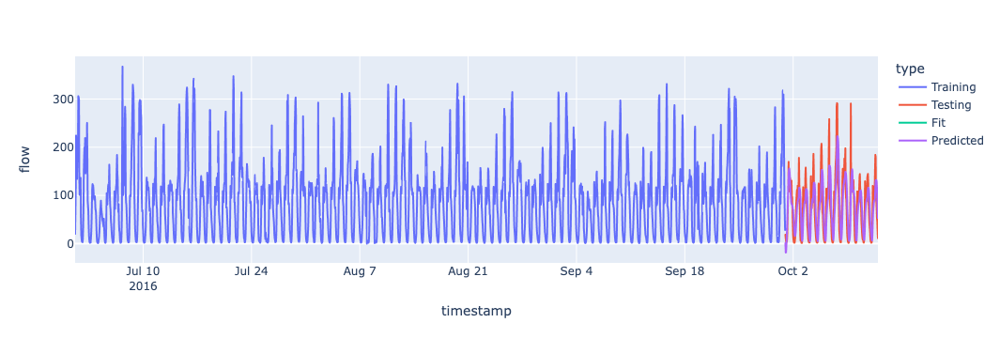

In [21]:
px.line(validate, y='flow', color='type')

In [22]:
print("RMSE:", np.sqrt(((test.flow - predict.flow)**2).mean()))
print("MAE:", abs(test.flow - predict.flow).mean())

RMSE: 42.57125001899994
MAE: 34.32472137226393


## SARIMAX

In [23]:
model = auto_arima(train['flow'],
                   exogenous=train[['mean', 'std']],
                   # start_p=1, start_q=1,
                   m=24,
                   # start_P=0, start_Q=0,
                   stationary=True, seasonal=True,
                   trace=True,
                   error_action="trace", suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[24] intercept   : AIC=inf, Time=27.14 sec
 ARIMA(0,0,0)(0,0,0)[24] intercept   : AIC=23639.483, Time=0.51 sec
 ARIMA(1,0,0)(1,0,0)[24] intercept   : AIC=20962.577, Time=10.66 sec
 ARIMA(0,0,1)(0,0,1)[24] intercept   : AIC=21573.796, Time=12.61 sec
 ARIMA(0,0,0)(0,0,0)[24]             : AIC=23685.571, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[24] intercept   : AIC=21350.179, Time=0.35 sec
 ARIMA(1,0,0)(2,0,0)[24] intercept   : AIC=20895.964, Time=114.81 sec
 ARIMA(1,0,0)(2,0,1)[24] intercept   : AIC=inf, Time=242.07 sec
 ARIMA(1,0,0)(1,0,1)[24] intercept   : AIC=inf, Time=20.05 sec
 ARIMA(0,0,0)(2,0,0)[24] intercept   : AIC=inf, Time=109.36 sec
 ARIMA(2,0,0)(2,0,0)[24] intercept   : AIC=20757.765, Time=141.49 sec
 ARIMA(2,0,0)(1,0,0)[24] intercept   : AIC=20833.886, Time=12.81 sec
 ARIMA(2,0,0)(2,0,1)[24] intercept   : AIC=inf, Time=298.24 sec
 ARIMA(2,0,0)(1,0,1)[24] intercept   : AIC=inf, Time=21.60 sec
 ARIMA(3,0,0)(2,0,0)[24] 

In [24]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                 2203
Model:             SARIMAX(4, 0, 1)x(2, 0, [], 24)   Log Likelihood              -10245.285
Date:                             Wed, 08 Feb 2023   AIC                          20512.570
Time:                                     04:11:59   BIC                          20575.244
Sample:                                 07-01-2016   HQIC                         20535.470
                                      - 09-30-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0160      0.067      0.237      0.812      -0.116       0.148
mean           0.8709      0.022     39.651      0.000       0.828       0.914
std            0.2982      0.036      8.226      0.000       0.227       0.369
ar.L1          1.7452      0.016    110.309      0.000       1.714       1.776
ar.L2         -0.9357      0.030    -31.387      0.000      -0.994      -0.877
ar.L3          0.1078      0.034      3.150      0.002       0.041       0.175
ar.L4         -0.0038      0.021     -0.182      0.856      -0.045       0.037
ma.L1         -0.9856      0.006   -160.402      0.000      -0.998      -0.974
ar.S.L24       0.3121      0.015     20.936      0.000       0.283       0.341
ar.S.L48       0.1679      0.015     11.539      0.000       0.139       0.196
sigma2       664.6032     12.455     53.360      0.000     640.192     689.015
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              4216.95
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -0.01
Prob(H) (two-sided):                  0.24   Kurtosis:                         9.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Validation

In [25]:
training_fit = pd.DataFrame(model.predict_in_sample(train[add_feats]),
                            index=train.index, columns=['flow'])
training_fit['type'] = "Fit"

In [26]:
predict = pd.DataFrame(model.predict(n_periods=len(test),
                                     X=test[add_feats]),
                       index=test.index, columns=['flow'])
predict['type'] = "Predicted"

In [27]:
validate = pd.concat([df, training_fit, predict])

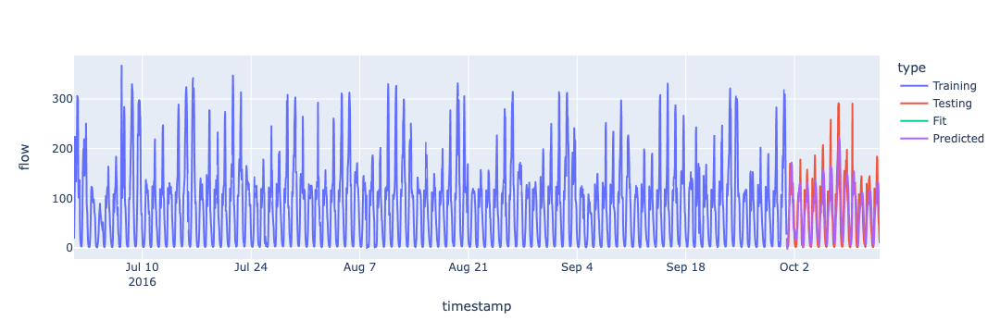

In [28]:
px.line(validate, y='flow', color='type')

In [29]:
print("RMSE:", np.sqrt(((test.flow - predict.flow)**2).mean()))
print("MAE:", abs(test.flow - predict.flow).mean())

RMSE: 39.72968685675224
MAE: 31.163456132793343


# Parking Durations

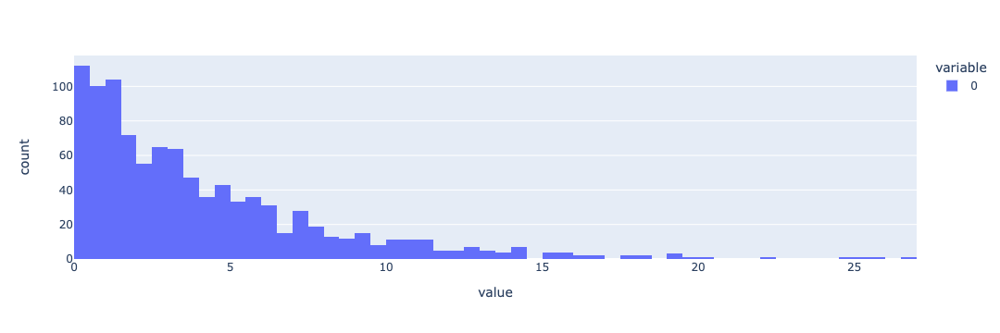

In [30]:
avg_charge_duration = 4.59
px.histogram(np.random.exponential(avg_charge_duration, size=1000), nbins=100)

In [31]:
assert predict.equals(predict.sort_index())

predict['flow'] = predict.flow.clip(lower=0).round().astype(int)

In [32]:
def generate_charge_time(row):
    durations = pd.to_timedelta(np.random.exponential(avg_charge_duration, size=row['flow']),
                                unit='hours')
    return pd.Series(-1, index=(row.name + durations), name='test')
    

In [33]:
exit_times = predict.progress_apply(lambda row: generate_charge_time(row), axis=1)\
                    .unstack().dropna().droplevel(1).to_frame('flow')

  0%|          | 0/288 [00:00<?, ?it/s]

In [34]:
exit_times['type'] = 'Exit'

In [35]:
df = pd.concat([predict, exit_times]).sort_index()

In [36]:
df['net_flow'] = df.flow.cumsum()
df['inflow'] = df.mask(df.flow<0).fillna(0).flow.cumsum()
df['outflow'] = df.mask(df.flow>=0).fillna(0).flow.cumsum()

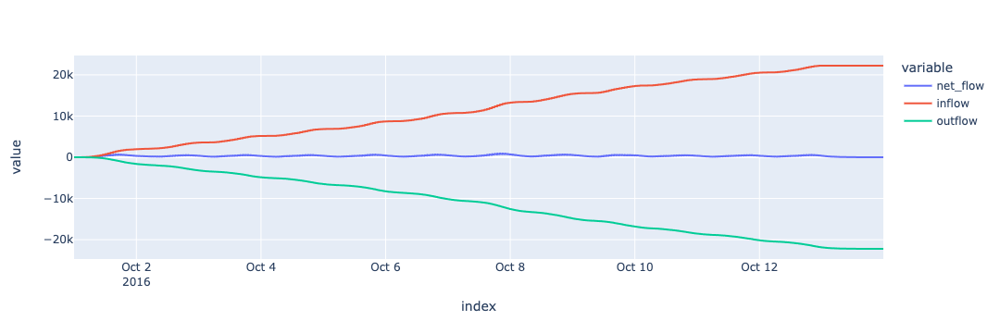

In [37]:
px.line(df, y=['net_flow', 'inflow', 'outflow'])